In [2]:
import math
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from ipywidgets import IntProgress
import os
import cv2
import PIL
import PIL.Image
import json
import random
from random import randint as rand
from os import listdir
from os.path import isfile, join
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

[]


In [3]:
import random
import tensorflow as tf
import matplotlib.image as mpimg
import numpy as np


def generator():
    path = r'C:\Users\Ильяс\.cache\roboflow\PPE.v14i.yolokeras\update__annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'C:\\Users\\Ильяс\\.cache\\roboflow\\PPE.v14i.yolokeras\\train\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                # Лейблы уже в формате x1, y1, x2, y2 (нормализованные 0..1) -> домножаем на 224
                x1 = float(li[0]) 
                y1 = float(li[1])
                x2 = float(li[2]) 
                y2 = float(li[3])
                w = x2-x1
                h=y2-y1

                x=(x1+x2)/2
                y=(y1+y2)/2
                x1=x
                y1=y
                x2=w
                y2=h
                

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        # Пока ротация только 0, поэтому боксы не меняем
        rotation = random.choice([0])
        rotated_image = tf.image.rot90(image, k=rotation)

        rotated_bbox = []
        for box in bbox:
            x1, y1, x2, y2 = box

            if rotation == 1:
                # ПРИМЕР (если будете включать ротацию 90°):
                # new_x1 = y1
                # new_y1 = 224 - x2
                # new_x2 = y2
                # new_y2 = 224 - x1
                # здесь можно дописать реальную логику, пока rotation=0 это не используется
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 2:
                # Аналогично, можно реализовать поворот на 180°
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 3:
                # Аналогично, поворот на 270°
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            else:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2

            # Добавляем флаг 0 для GT боксов
            rotated_bbox.append([new_x1, new_y1, new_x2, new_y2, 0.0])

        

        all_boxes = rotated_bbox 

        yield (rotated_image, tf.constant(all_boxes, dtype=tf.float32))
def valid_generator():
    path = r'C:\Users\Ильяс\.cache\roboflow\PPE.v14i.yolokeras\update_test_annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'C:\\Users\\Ильяс\\.cache\\roboflow\\PPE.v14i.yolokeras\\test\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                # Формат x1, y1, x2, y2 (нормализованные) -> домножаем на 224
                x1 = float(li[0]) 
                y1 = float(li[1]) 
                x2 = float(li[2]) 
                y2 = float(li[3]) 
                w=x2-x1
                h=y2-y1

                x=(x1+x2)/2
                y=(y1+y2)/2
                x1=x
                y1=y
                x2=w
                y2=h

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        # Добавляем флаг 0 для GT боксов в валидационном наборе
        bbox_with_flag = [[x1, y1, x2, y2, 0.0] for x1, y1, x2, y2 in bbox]

        yield (image, tf.constant(bbox_with_flag, dtype=tf.float32))
# Создаем datasets для одиночных примеров
dataset = tf.data.Dataset.from_generator(
    generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32)  # [x1, y1, x2, y2, flag]
    )
)

valid_dataset = tf.data.Dataset.from_generator(
    valid_generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32)  # [x1, y1, x2, y2, flag]
    )
)

# Кэшируем и перемешиваем (БЕЗ .batch()!)
dataset = dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE).shuffle(100)
valid_dataset = valid_dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


In [4]:
backbone_encoder = tf.keras.models.load_model(
    r'models/base_classifier.h5', 
    compile=False,
)

In [46]:
from sklearn.linear_model import Ridge
import joblib

ridge_model = joblib.load('models/baseline.joblib')

In [58]:
output_tensor = backbone_encoder.output
clipped_model = tf.keras.Model(backbone_encoder.input, output_tensor)

In [59]:
clipped_model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 616,256 (2.35 MB)

 Trainable params: 334,272 (1.28 MB)

 Non-trainable params: 281,984 (1.08 MB)

In [60]:
X = []
y = []

for el in dataset:
    X.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y.append(el[1][:, :-1])

X = np.array(X)


In [61]:
y = np.array(y, dtype=object) 

In [62]:
y = y.reshape(y.shape[0], -1)

In [63]:
y = [el[0].numpy().flatten() for el in y]

In [64]:
X.shape

(3725, 1, 7, 7, 1152)

In [65]:
max_len = max(len(el) for el in y)

In [66]:
max_len

200

In [67]:
y_padded = []
for arr in y:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y = np.array(y_padded)


In [68]:
y.shape

(3725, 200)

In [69]:
X_val = []
y_val = []
for el in valid_dataset:
    X_val.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y_val.append(el[1][:, :-1])

X_val = np.array(X_val)


In [70]:
y_val = np.array(y_val, dtype = np.object_)

In [71]:
y_val = y_val.reshape(y_val.shape[0], -1)

In [72]:
y_val = [el[0].numpy().flatten() for el in y_val]

In [73]:
y_val[0]

array([0.49140626, 0.16484375, 0.1171875 , 0.1046875 , 0.5023438 ,
       0.43828124, 0.1921875 , 0.2984375 , 0.49765626, 0.5359375 ,
       0.2765625 , 0.928125  ], dtype=float32)

In [74]:
y_padded = []
for arr in y_val:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y_val = np.array(y_padded)

In [75]:
X_val.shape

(92, 1, 7, 7, 1152)

In [76]:
y_val.shape

(92, 200)

In [83]:
feat = tf.keras.Input((1,7,7,1152))
x = tf.keras.layers.Reshape((7,7,1152))(feat)
x = tf.keras.layers.GlobalAveragePooling2D()(x)

ridge_gap = tf.keras.Model(feat, x)

In [87]:
ridge_train = ridge_gap.predict(X)

117/117 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


In [89]:
ridge_train = ridge_model.predict(ridge_train)

In [90]:
ridge_val = ridge_gap.predict(X_val)
ridge_val = ridge_model.predict(ridge_val)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


In [96]:
X = np.squeeze(X, axis=1)        # (B, 7, 7, 1152)
X_val = np.squeeze(X_val, axis=1)

In [199]:
from tensorflow.keras.regularizers import l2
def masked_ciou_loss(y_true, y_pred):

    true_boxes = tf.reshape(y_true, (-1, 50, 4))
    pred_boxes = tf.reshape(y_pred, (-1, 50, 4))


    mask = tf.cast(tf.reduce_sum(tf.abs(true_boxes), axis=-1) > 0.0001, tf.float32)
    mask = tf.expand_dims(mask, axis=-1)

    gt_cx, gt_cy, gt_w, gt_h = tf.unstack(true_boxes, axis=-1)
    p_cx, p_cy, p_w, p_h = tf.unstack(pred_boxes, axis=-1)

    gt_x1 = gt_cx - gt_w / 2.0
    gt_y1 = gt_cy - gt_h / 2.0
    gt_x2 = gt_cx + gt_w / 2.0
    gt_y2 = gt_cy + gt_h / 2.0

    p_x1 = p_cx - p_w / 2.0
    p_y1 = p_cy - p_h / 2.0
    p_x2 = p_cx + p_w / 2.0
    p_y2 = p_cy + p_h / 2.0

    inter_x1 = tf.maximum(gt_x1, p_x1)
    inter_y1 = tf.maximum(gt_y1, p_y1)
    inter_x2 = tf.minimum(gt_x2, p_x2)
    inter_y2 = tf.minimum(gt_y2, p_y2)

    inter_w = tf.maximum(0.0, inter_x2 - inter_x1)
    inter_h = tf.maximum(0.0, inter_y2 - inter_y1)
    inter_area = inter_w * inter_h

    gt_area = gt_w * gt_h
    p_area = p_w * p_h
    union_area = gt_area + p_area - inter_area + 1e-7

    iou = inter_area / union_area

    c_x1 = tf.minimum(gt_x1, p_x1)
    c_y1 = tf.minimum(gt_y1, p_y1)
    c_x2 = tf.maximum(gt_x2, p_x2)
    c_y2 = tf.maximum(gt_y2, p_y2)
    
    c_diag = tf.square(c_x2 - c_x1) + tf.square(c_y2 - c_y1) + 1e-7
    rho2 = tf.square(gt_cx - p_cx) + tf.square(gt_cy - p_cy)
    diou = rho2 / c_diag


    w_h_ratio_gt = tf.atan(gt_w / (gt_h + 1e-7))
    w_h_ratio_pred = tf.atan(p_w / (p_h + 1e-7))
    
    v = (4.0 / (math.pi ** 2)) * tf.square(w_h_ratio_gt - w_h_ratio_pred)
    
    alpha = v / (1.0 - iou + v + 1e-7)
    
    ciou_val = iou - diou - (alpha * v)
    
    ciou_loss_val = 1.0 - ciou_val
    

    obj_loss = ciou_loss_val * tf.squeeze(mask, axis=-1)


    no_obj_mask = 1.0 - mask
    
    silence_loss = tf.reduce_sum(tf.square(pred_boxes), axis=-1) 
    silence_loss = silence_loss * tf.squeeze(no_obj_mask, axis=-1)

    silence_weight = 0.6 
    
    total_loss = tf.reduce_sum(obj_loss) + silence_weight * tf.reduce_sum(silence_loss)
    
    num_objects = tf.reduce_sum(mask) + 1.0
    
    return total_loss / num_objects



def create_ciou_mlp():
    feat_in  = tf.keras.Input(shape=(7,7,1152), name="feat")
    ridge_in = tf.keras.Input(shape=(200,), name="ridge")

    x = tf.keras.layers.Conv2D(128, 1, activation="relu")(feat_in)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    ridge_emb = tf.keras.layers.Dense(32, activation = 'relu')(ridge_in)

    x = tf.keras.layers.Concatenate(axis=-1)([x, ridge_emb])

    x = tf.keras.layers.Dense(200, activation = 'sigmoid')(x)

    model = tf.keras.Model([feat_in, ridge_in], x)
    model.compile(optimizer=tf.keras.optimizers.Adam(1e-3), loss=masked_ciou_loss)
    
    return model




y_train_padded = y 
model = create_ciou_mlp()
history = model.fit(
    [X, ridge_inp], y,
    validation_data=([X_val, ridge_val], y_val),
    batch_size=32,
    epochs=1000,
    
)



Epoch 1/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.5609 - val_loss: 0.8736
Epoch 2/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.0678 - val_loss: 0.8519
Epoch 3/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.9994 - val_loss: 0.8227
Epoch 4/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.9570 - val_loss: 0.8519
Epoch 5/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.9373 - val_loss: 0.8182
Epoch 6/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.9123 - val_loss: 0.7807
Epoch 7/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.8874 - val_loss: 0.8162
Epoch 8/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.8750 - val_loss: 0.8052
Epoch 9/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.8648 - val_loss: 0.7602
Epoch 10/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.8512 - val_loss: 0.7851
Epoch 11/1000
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.8444 - val_loss: 0.7456
Epoch 12/1000
117/117 ━━━━━━━━

In [200]:
model.summary()

Model: "functional_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ feat (InputLayer)             │ (None, 7, 7, 1152)        │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_38 (Conv2D)            │ (None, 7, 7, 128)         │         147,584 │ feat[0][0]                 │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ ridge (InputLayer)            │ (None, 200)               │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_average_pooling2d_32   │ (None, 128)               │               0 │ conv2d_38[0][0]            │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_72 (Dense)              │ (None, 32)                │           6,432 │ ridge[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ concatenate_18 (Concatenate)  │ (None, 160)               │               0 │ global_average_pooling2d_… │
│                               │                           │                 │ dense_72[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_73 (Dense)              │ (None, 200)               │          32,200 │ concatenate_18[0][0]       │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 558,650 (2.13 MB)

 Trainable params: 186,216 (727.41 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 372,434 (1.42 MB)

In [201]:
y_pred = model.predict([X_val, ridge_val])

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step 


In [202]:
(y_pred[0] * 224).max()

np.float32(205.48993)

In [203]:
from sklearn.metrics import mean_squared_error

In [204]:
mean_squared_error(y_val * 224, y_pred * 224)

np.float32(111.64381)

In [205]:
def restore_bboxes_auto(padded_array, threshold=0):
    
    non_zero_indices = np.where(np.abs(padded_array) > threshold)[0]
    
    if len(non_zero_indices) == 0:
        return np.array([]).reshape(0, 4)
    
    last_non_zero = non_zero_indices[-1]
    
    num_elements = last_non_zero + 1
    
    if num_elements % 4 != 0:
        num_elements = (num_elements // 4) * 4
        print(f"Внимание: количество элементов {last_non_zero+1} не кратно 4. Используем {num_elements}")
    
    real_data = padded_array[:num_elements]
    
    num_bboxes = num_elements // 4
    
    return real_data.reshape(num_bboxes, 4)

restored_auto = restore_bboxes_auto(y_pred[0])
print(f"Автоматически восстановлено bbox: {restored_auto.shape}")

Автоматически восстановлено bbox: (50, 4)


In [206]:
y_pred = [restore_bboxes_auto(el) for el in y_pred]

In [207]:
images = [el[0] for el in valid_dataset]

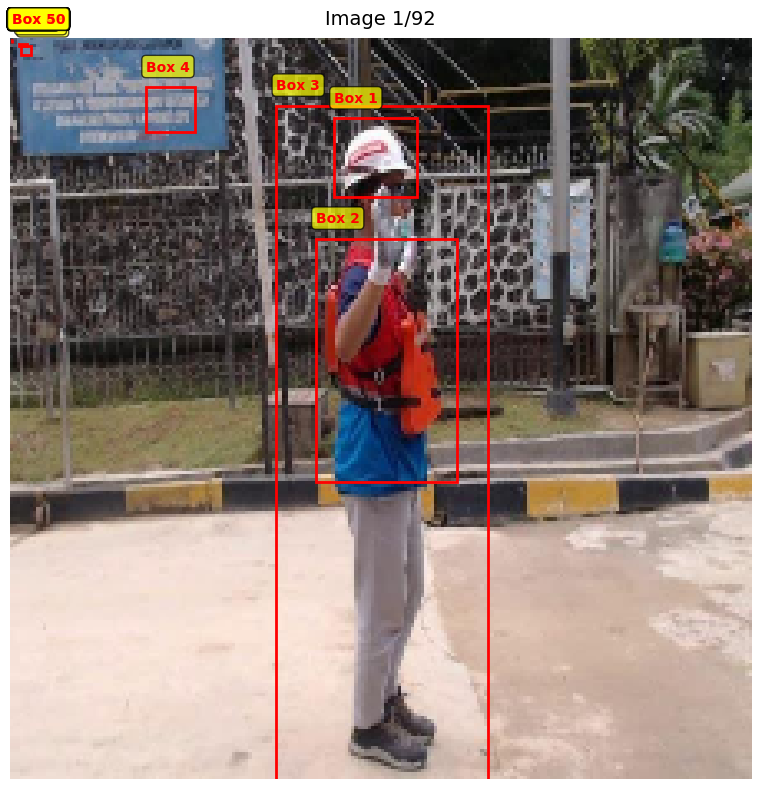

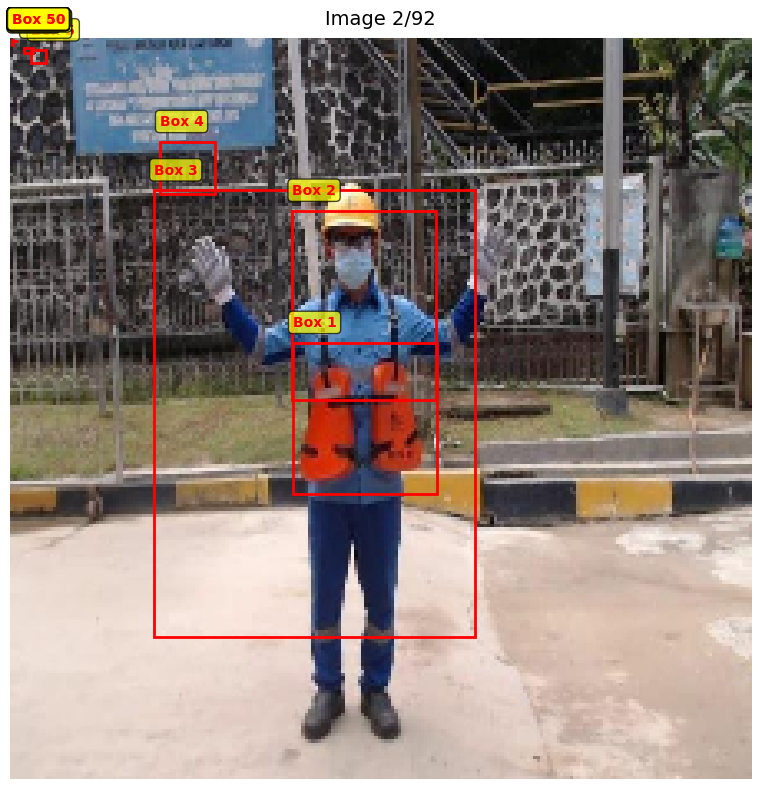

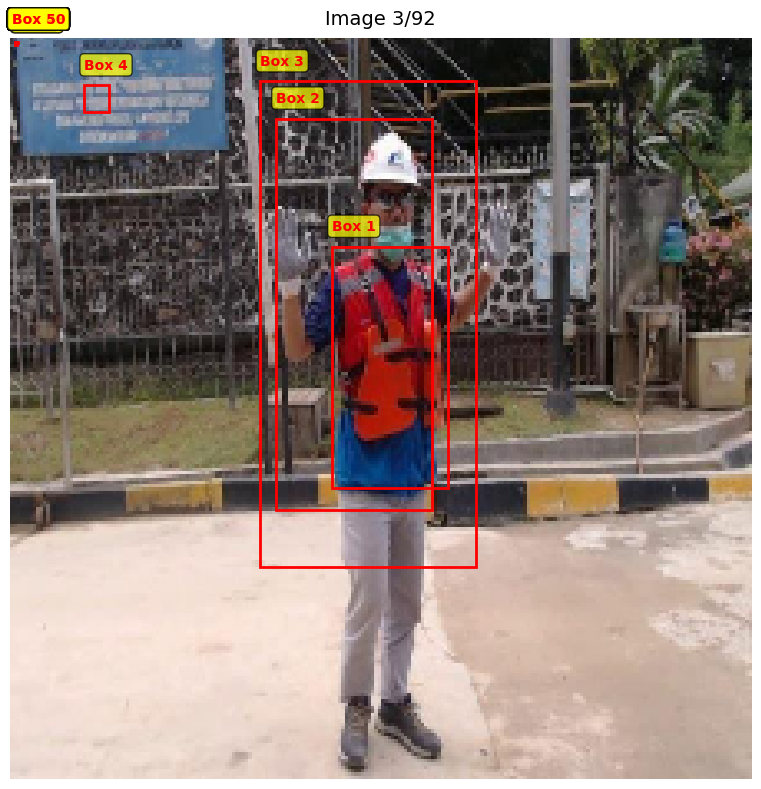

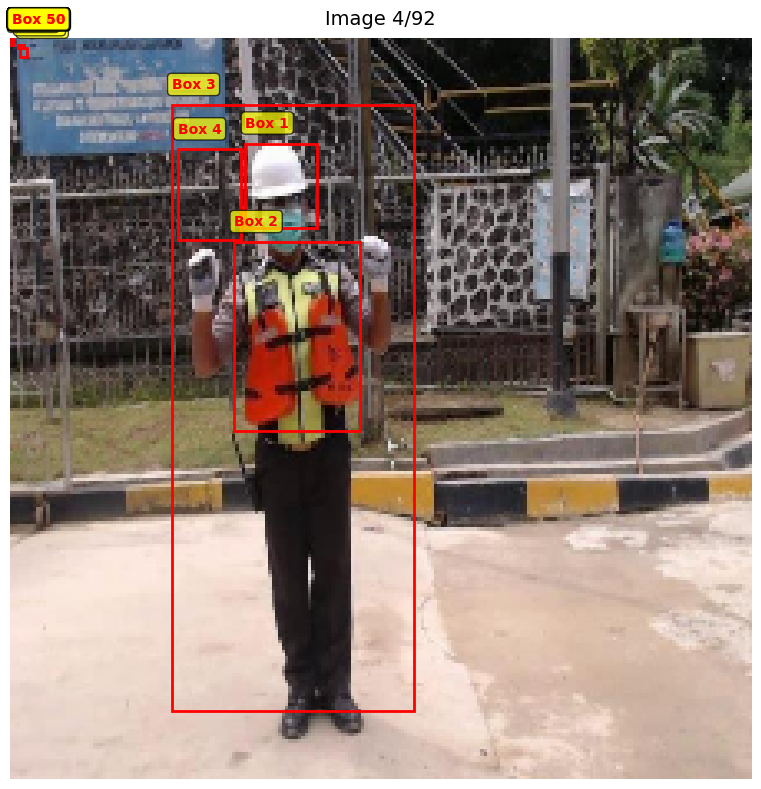

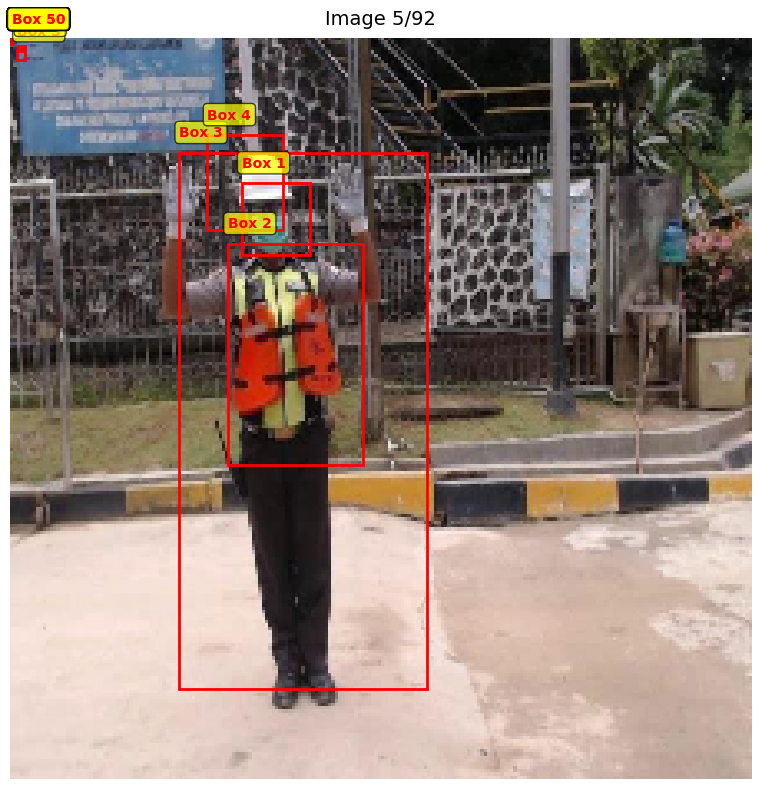

...

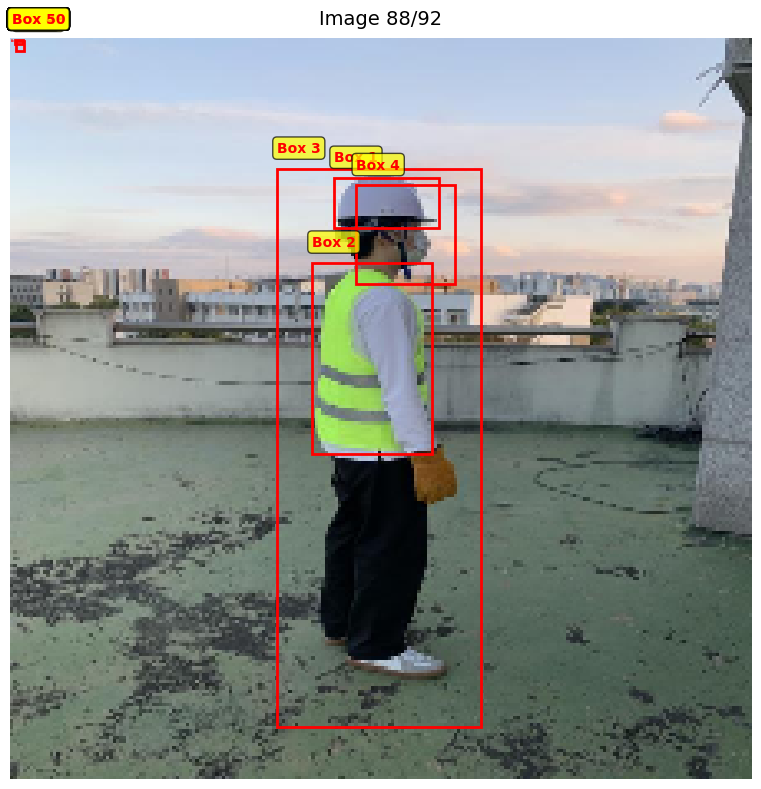

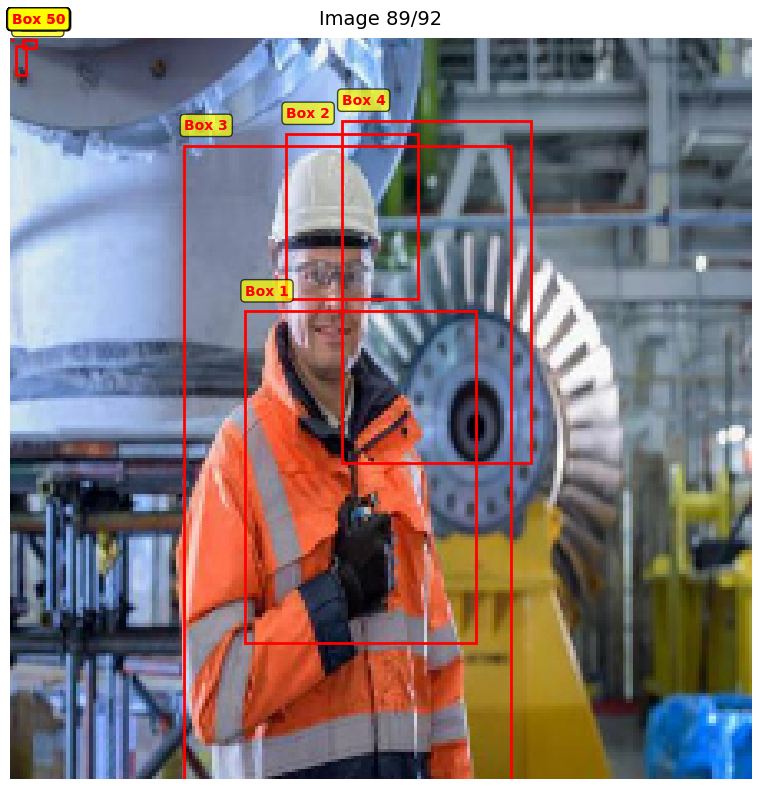

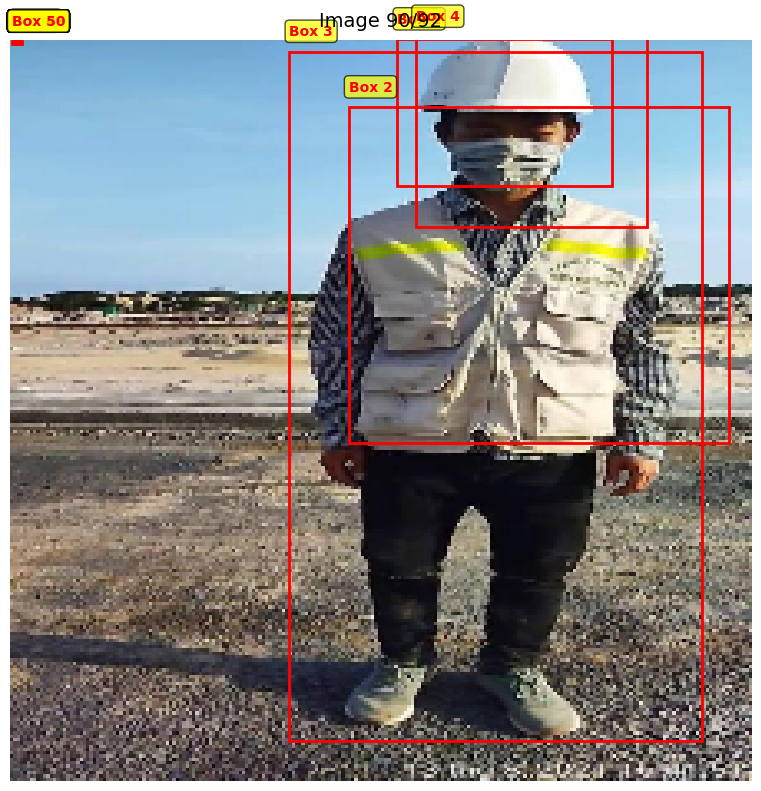

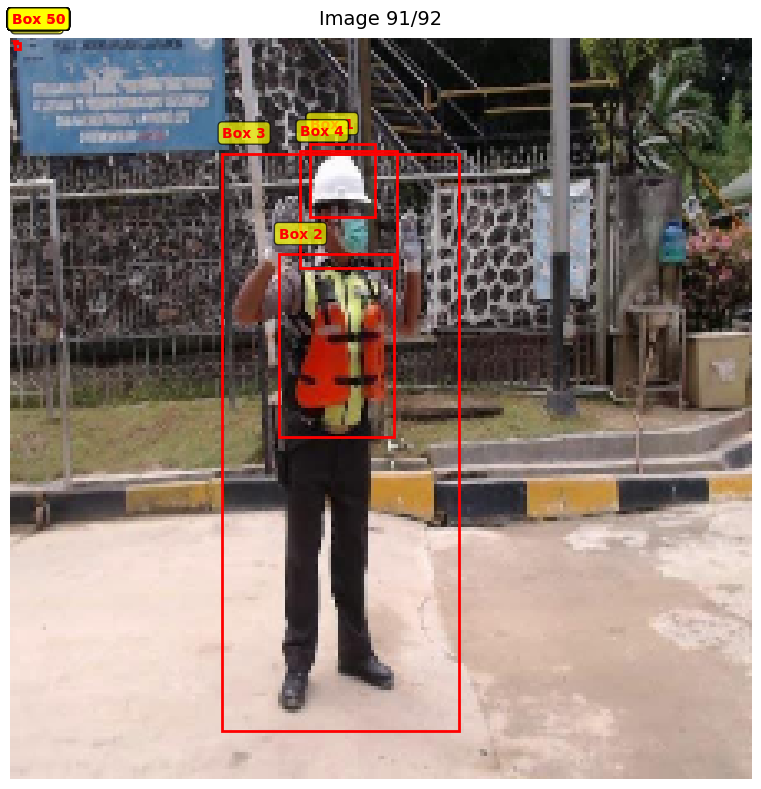

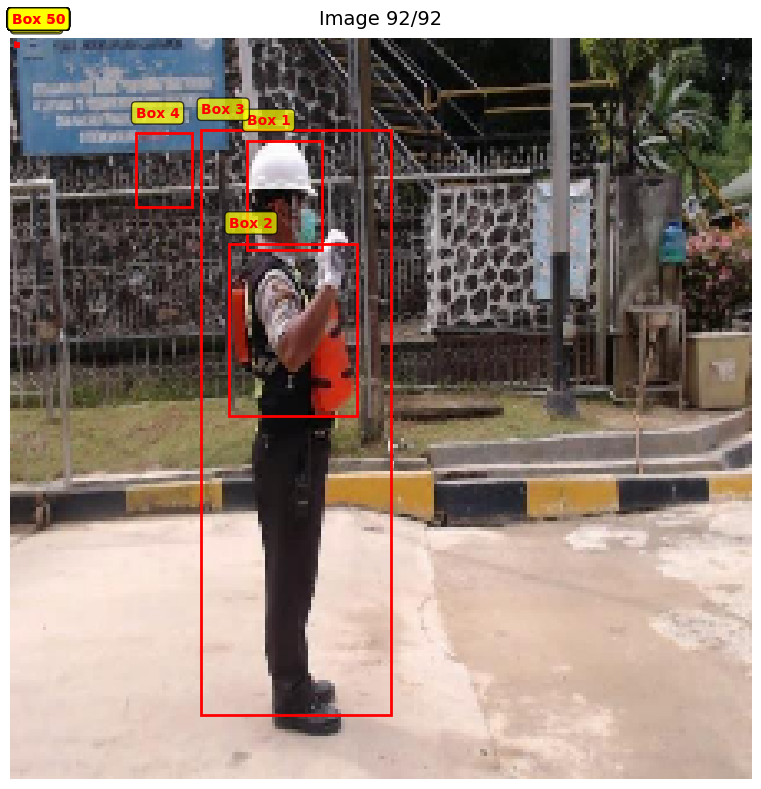


Отображено 92 изображений


In [208]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_predictions(images, bboxes, num_samples=5, figsize=(12, 8), conf_threshold=0.5):
    
    
    num_to_show = min(num_samples, len(images), len(bboxes))
    
    for i in range(num_to_show):
        fig, ax = plt.subplots(1, figsize=figsize)
        
        ax.imshow(images[i])
        ax.axis('off')
        ax.set_title(f'Image {i+1}/{num_to_show}', fontsize=14, pad=10)
        
        img_bboxes = bboxes[i]
        
        if not isinstance(img_bboxes, (list, np.ndarray)):
            img_bboxes = [img_bboxes]
        
        if len(img_bboxes) == 0:
            ax.text(112, 112, 'No objects detected', 
                   ha='center', va='center', 
                   fontsize=12, color='red',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        else:
            for idx, bbox in enumerate(img_bboxes):
                if len(bbox) >= 4:
                    x, y, w, h = bbox[0] * 224, bbox[1] * 224, bbox[2] * 224, bbox[3] * 224
                    x-=w/2
                    y-=h/2
                    
                 
                    rect = patches.Rectangle(
                        (x, y), w, h,
                        linewidth=2,
                        edgecolor='red',
                        facecolor='none',
                        linestyle='-'
                    )
                    ax.add_patch(rect)
                    
                    ax.text(
                        x, y - 5,
                        f'Box {idx+1}',
                        color='red',
                        fontsize=10,
                        weight='bold',
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7)
                    )
                    
                    if len(bbox) >= 5:
                        conf = float(bbox[4])
                        if conf >= conf_threshold:
                            ax.text(
                                x, y + h + 15,
                                f'Conf: {conf:.2f}',
                                color='green',
                                fontsize=9,
                                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7)
                            )
        
        plt.tight_layout()
        plt.show()
    
    print(f'\nОтображено {num_to_show} изображений')



visualize_predictions(images, y_pred, num_samples=100)


In [209]:
model.save('models/RPN_MODEL.h5')

In [210]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)


In [211]:
converter.optimizations = [tf.lite.Optimize.DEFAULT]

In [212]:
tflite_model = converter.convert()


INFO:tensorflow:Assets written to: C:\Users\47A8~1\AppData\Local\Temp\tmpwasgix1i\assets


INFO:tensorflow:Assets written to: C:\Users\47A8~1\AppData\Local\Temp\tmpwasgix1i\assets


Saved artifact at 'C:\Users\47A8~1\AppData\Local\Temp\tmpwasgix1i'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): List[TensorSpec(shape=(None, 7, 7, 1152), dtype=tf.float32, name='feat'), TensorSpec(shape=(None, 200), dtype=tf.float32, name='ridge')]
Output Type:
  TensorSpec(shape=(None, 200), dtype=tf.float32, name=None)
Captures:
  2432762102800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2432762104144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2432762104528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2432762103568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2432762105296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2432762105104: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [213]:
with open("models/model.tflite", "wb") as f:
    f.write(tflite_model)